In [1]:
import numpy as np
import pandas as pd
import os
import itertools
import tensorflow as tf
from keras.utils import to_categorical
from sklearn.preprocessing import LabelBinarizer, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
from keras.models import Sequential
from keras.layers import Embedding, Flatten, Dense, LSTM, Dropout
from keras.preprocessing import text, sequence
from keras import utils
from keras import callbacks
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

/Applications/anaconda/envs/python3/lib/python3.5/site-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/Applications/anaconda/envs/python3/lib/python3.5/site-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/Applications/anaconda/envs/python3/lib/python3.5/site-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/Applications/anaconda/envs/python3/lib/pyt

In [2]:
df = pd.read_csv('nyt2019.csv', dtype=str, na_values=['none'])
df.shape

(65805, 8)

In [3]:
df = df.fillna('').astype(str)
df = df.astype(str)

In [4]:
df.head(2)

,section_name,headline,kicker,abstract,lead_paragraph,snippet,keywords,pub_date
0,Arts,William Forsythe: ‘Isn’t Ballet Delightful?’,,The choreographer has recently made an abrupt ...,BOSTON — “Give me a little booty! Show off! Gl...,The choreographer has recently made an abrupt ...,"Dancing, Boston Ballet, Forsythe, William (194...",2019-03-01T08:43:14+0000
1,Books,Exiled to Siberia: A First Novel Revisits Stal...,Fiction,The heroine of Guzel Yakhina’s “Zuleikha” is a...,ZULEIKHA By Guzel Yakhina,The heroine of Guzel Yakhina’s “Zuleikha” is a...,"Books and Literature, Zuleikha (Book), Yakhina...",2019-03-01T10:00:05+0000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65805 entries, 0 to 65804
Data columns (total 8 columns):
section_name      65805 non-null object
headline          65805 non-null object
kicker            65805 non-null object
abstract          65805 non-null object
lead_paragraph    65805 non-null object
snippet           65805 non-null object
keywords          65805 non-null object
pub_date          65805 non-null object
dtypes: object(8)
memory usage: 4.0+ MB


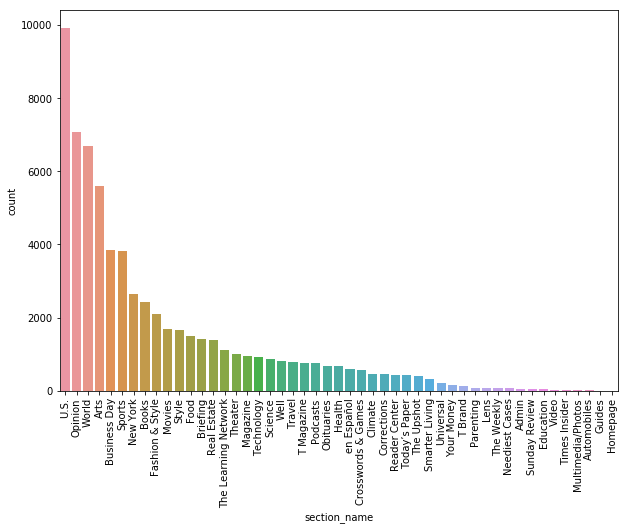

In [6]:
fig, ax = plt.subplots(figsize=(10,7))

sns.countplot(x='section_name', 
              data=df,
              ax=ax,
              order=df['section_name'].value_counts().index)
plt.xticks(rotation=90)
plt.show()

In [7]:
for x in range(5):
    print(df['section_name'][x])
    print(df['headline'][x])
    print(df['lead_paragraph'][x])
    print(df['snippet'][x])
    print("")

Arts
William Forsythe: ‘Isn’t Ballet Delightful?’
BOSTON — “Give me a little booty! Show off! Glissade, glissade, tombé, ballonné, piqué, yessssss!” William Forsythe called out ballet steps, bouncing through them on sneakered feet. 
The choreographer has recently made an abrupt change in creative direction — back to ballet. In “Full on Forsythe,” Boston Ballet will show off his new moves.

Books
Exiled to Siberia: A First Novel Revisits Stalin’s Great Purge
ZULEIKHA By Guzel Yakhina
The heroine of Guzel Yakhina’s “Zuleikha” is a young Tatar widow, forced into a horror-filled journey that will end in Russia’s frozen wilderness.

U.S.
Women’s History Myths, Debunked
It’s Women’s History Month! You’re reading In Her Words, where women rule the headlines. Sign up here to get it delivered to your inbox. Let me know what you think at dearmaya@nytimes.com.
Almost everything we know about women’s history is wrong. This week, a few of the biggest myths get busted.

Theater
Review: ‘Superhero,’ 

In [9]:
texts = [x for x in df[['headline', 'lead_paragraph', 'snippet']].apply(lambda x: ' '.join(x), axis=1)]
labels = [x for x in df['section_name']]

In [10]:
max_words = 1000
maxlen = 100
training_samples = int(len(texts)*.6)
validation_samples = int(len(texts)*.2)

In [11]:
tokenizer = text.Tokenizer(num_words=max_words, char_level=False)
tokenizer.fit_on_texts(texts) # only fit on train
sequences = tokenizer.texts_to_sequences(texts)

In [12]:
word_index = tokenizer.word_index
print(len(word_index))

84334


In [13]:
data = sequence.pad_sequences(sequences, maxlen=maxlen)

In [14]:
len(np.unique(labels))

49

In [15]:
le = LabelEncoder()
labels = to_categorical(le.fit_transform(labels),num_classes=len(np.unique(labels)))

In [16]:
labels.shape

(65805, 49)

In [17]:
indices = np.arange(data.shape[0])
np.random.shuffle(indices)
data = data[indices]
labels = labels[indices]

In [18]:
x_train = data[:training_samples]
y_train = labels[:training_samples]
x_val = data[training_samples: training_samples+validation_samples]
y_val = labels[training_samples: training_samples+validation_samples]

In [19]:
num_classes = labels.shape[1]

In [20]:
glove_dir = '/Users/twitter/Desktop/Current Research/news/glove/'

embeddings_index = {}
f = open(os.path.join(glove_dir, 'glove.6B.100d.txt'))
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()

print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


In [21]:
embedding_dim = 100

embedding_matrix = np.zeros((max_words, embedding_dim))
for word, i in word_index.items():
    if i < max_words:
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            embedding_matrix[i] = embedding_vector

In [22]:
embedding_matrix.shape

(1000, 100)

In [23]:
maxlen

100

In [24]:
max_words

1000

In [25]:
embedding_dim

100

In [26]:
max_features = max_words
batch_size = 32

In [27]:
print("Max Features: {}".format(max_features))
print("embedding_dim: {}".format(embedding_dim))

Max Features: 1000
embedding_dim: 100


In [28]:
model = Sequential()
model.add(Embedding(max_features, 100))
model.add(LSTM(128, 
               return_sequences=True,
               dropout=0.3))
model.add(LSTM(128, 
               return_sequences=True,
               dropout=0.3))
model.add(LSTM(64,
               dropout=0.3))
model.add(Dense(49, activation='softmax'))

model.layers[0].set_weights([embedding_matrix])
model.layers[0].trainable = False

Instructions for updating:
keep_dims is deprecated, use keepdims instead


In [29]:
model.layers[0].set_weights([embedding_matrix])
model.layers[0].trainable = False

In [96]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, None, 100)         100000    
_________________________________________________________________
lstm_1 (LSTM)                (None, None, 128)         117248    
_________________________________________________________________
lstm_2 (LSTM)                (None, None, 128)         131584    
_________________________________________________________________
lstm_3 (LSTM)                (None, 64)                49408     
_________________________________________________________________
dense_1 (Dense)              (None, 49)                3185      
Total params: 401,425
Trainable params: 301,425
Non-trainable params: 100,000
_________________________________________________________________


In [30]:
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

Instructions for updating:
keep_dims is deprecated, use keepdims instead


In [31]:
batch_size = 32
epochs = 60

callbacks_list = [
        callbacks.EarlyStopping(monitor='acc',
                                patience=2),
        callbacks.ModelCheckpoint(filepath='nyt_glove_lstm.h5',
                                  monitor='val_acc',
                                  save_best_only=True)]



history = model.fit(x_train, y_train,
                    batch_size=batch_size,
                    epochs=epochs,
                    verbose=1,
                    callbacks=callbacks_list,
                    validation_data=[x_val,y_val])

Train on 39483 samples, validate on 13161 samples
Epoch 1/60
39483/39483 [==============================] - 340s 9ms/step - loss: 2.5105 - acc: 0.3034 - val_loss: 1.9328 - val_acc: 0.4662

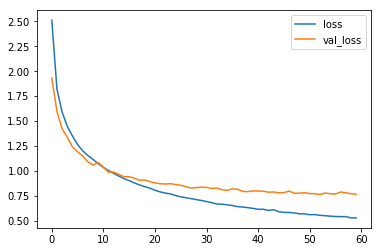

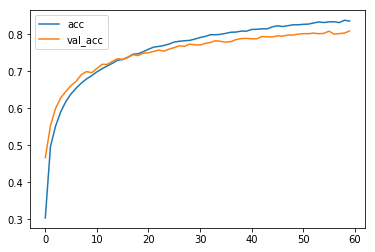

In [32]:
history_df = pd.DataFrame(history.history)
history_df[['loss', 'val_loss']].plot()
history_df[['acc', 'val_acc']].plot()

In [40]:
x_test = data[-validation_samples:]
y_test = labels[-validation_samples:]

In [47]:
y_pred = model.predict_classes(x_test)

In [55]:
y_test_labels = np.argmax(y_test, axis=1)

In [57]:
cm = confusion_matrix(le.inverse_transform(y_test_labels), le.inverse_transform(y_pred))

In [94]:
def plt_confusion_matrix(cm, classes, normalize=False,):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    plt.imshow(cm,
               interpolation='nearest', 
               cmap=plt.cm.magma_r)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, round(cm[i, j],2),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

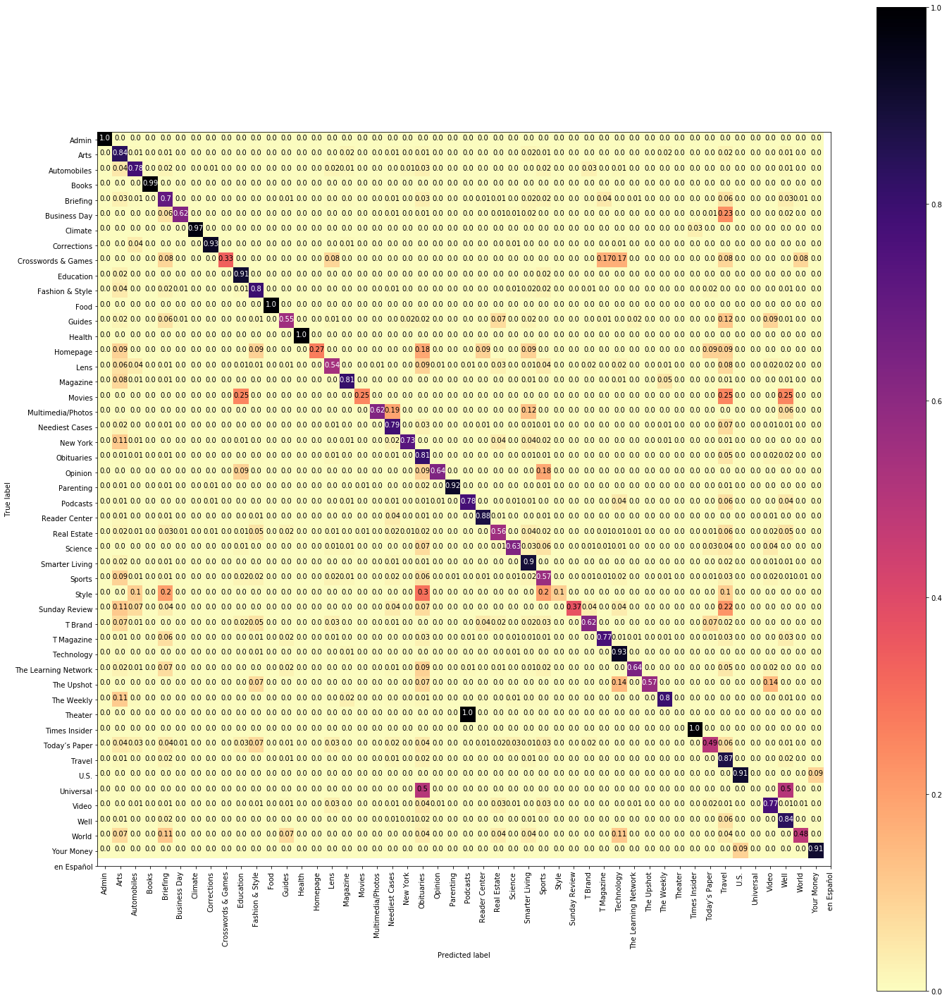

In [95]:
plt.figure(figsize=(20,20))
plt_confusion_matrix(cm, 
                     le.classes_, 
                     normalize=True)
plt.show()

In [101]:
acc = accuracy_score(le.inverse_transform(y_test_labels), le.inverse_transform(y_pred))

In [104]:
print("{}% Accuracy on test data".format(round(acc,3)*100))

80.5% Accuracy on test data
